# Analysis based on cleaned data.

Yixiu Chen     Netid: yc3691

## Preparation

#### The analysis is based on cleaned data 'cleaned_integrated_data.pkl' created in [part_2](https://github.com/huanghao-code/big_data_project/tree/master/part2)

In [1]:
import pandas as pd
import numpy as np
# import lightgbm as lgb
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
from sklearn.model_selection import train_test_split
import numpy as np
import pickle
from collections import namedtuple
import math

filename = '../cleaned_integrated_data.pkl'
# To display all cols.
pd.set_option('display.max_columns', None)
# To display all rows.
pd.set_option('display.max_rows', None)



### Read cleaned data and convert it into a pandas datagram

In [2]:
Combined = namedtuple('Combined', 'measure confirmed tested')
Measure = namedtuple('Measure', 'C1 C2, C3, C4, C5, C6, C7, C8, H1, stringency')
Confirmed = namedtuple('Confirmed', 'cumulative daily')
Tested = namedtuple('Tested', 'cumulative daily')

with open(filename, 'rb') as fp:
    loaded = pickle.load(fp)


lis = []
for key in loaded:
    lis_now = []
    lis_now.append(key[0])
    lis_now.append(key[1])
    for lisx in loaded[key]:
        for ele in lisx:
            lis_now.append(ele)
    lis.append(lis_now)
    
data = pd.DataFrame(lis)

In [3]:
#data = pd.read_csv("data_for_Big_data.csv")
data.columns = ["Date", "Country","School closing", "Workplace closing","Cancel public events",
                "Restrictions on gatherings","Close public transport", "Stay at home requirements",
                "Restrictions on internal movement", "International travel controls","Public information campaigns",
                "stringency","Confirmed cumulative", "Confirmed daily","Tested cumulative", "Tested daily"]


#### Determine if there are still missing values in the data

In [4]:
for col_name in data.columns.values.tolist():
    if data[col_name].isnull().any():
        print(col_name)

Confirmed daily
Tested daily


#### Directly filled Tested Daily with the data of the next day to today.

In [5]:
data = data.fillna(method='bfill')

#### Brute forcely drop the NaN data. 
With the fillna operations above. There will be only a few data that will be droped. 
Only for those countries whose one or more columns are all NaN. 

In [6]:
data = data.dropna()

#### Add helper variable(s)

In [7]:
numOfCountries = pd.DataFrame(data,columns=["Country"]).drop_duplicates().count()

#### Because the stringency index already contains information about the 9 features in the data, we believe that the stringency index can reflect government actions very well.

#### Therefore, by exploring the relationship between epidemic data and stringency index, we can understand the relationship between government behavior and COVID-19

#### Based on this, we can disassemble the original problem into two questions.
Question 1: Is there a correlation between the epidemic trend and government actions?


Question 2: Whether machine learning can be used to predict the relationship between the epidemic trend and the government control measures.

#### Now the difficulty is, the confirmed cumulative and tested cumulative data can only reflect the absolute value and they can not represent the trend and spreading of COVID-19 accurately. 
#### We need to introduce two new variables, increase rate and infection density, which are expected to alleviate the problem.

Increase_rate = (Confirmed daily / Confirmed cumulative)

Infection_density = (Confirmed daily / Tested daily)






In [8]:
data["Increase_rate"] = [data["Confirmed daily"].values[i]/data["Confirmed cumulative"].values[i] for i in range(data.shape[0])]
data["Infection_density"] = [data["Confirmed daily"].values[i]/data["Tested daily"].values[i] for i in range(data.shape[0])]

/Users/chenyixiu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.


#### Take a look on data.

In [9]:
data.sample(5)

,Date,Country,School closing,Workplace closing,Cancel public events,Restrictions on gatherings,Close public transport,Stay at home requirements,Restrictions on internal movement,International travel controls,Public information campaigns,stringency,Confirmed cumulative,Confirmed daily,Tested cumulative,Tested daily,Increase_rate,Infection_density
848,2020-04-26,Cuba,3.0,3.0,2.0,0.0,2.0,2.0,2.0,4.0,2.0,83.07,1369,32.0,41651,1823.0,0.023375,0.017553
3004,2020-05-06,Qatar,3.0,2.0,2.0,4.0,2.0,2.0,1.0,4.0,2.0,90.74,17972,830.0,112963,3201.0,0.046183,0.259294
2805,2020-05-12,Philippines,3.0,3.0,2.0,4.0,2.0,2.0,2.0,3.0,2.0,94.58,11350,264.0,171608,13009.0,0.023260,0.020294
3264,2020-04-28,Senegal,3.0,0.0,2.0,4.0,0.0,0.0,2.0,4.0,2.0,66.67,823,87.0,9917,873.0,0.105711,0.099656
471,2020-05-16,Bolivia,3.0,3.0,2.0,4.0,2.0,2.0,2.0,4.0,2.0,97.35,3826,249.0,9912,249.0,0.065081,1.000000


## Descriptive statistics and virtualization

#### Get increase_rate figure. 

In [10]:
unique_co = data.Country.unique()

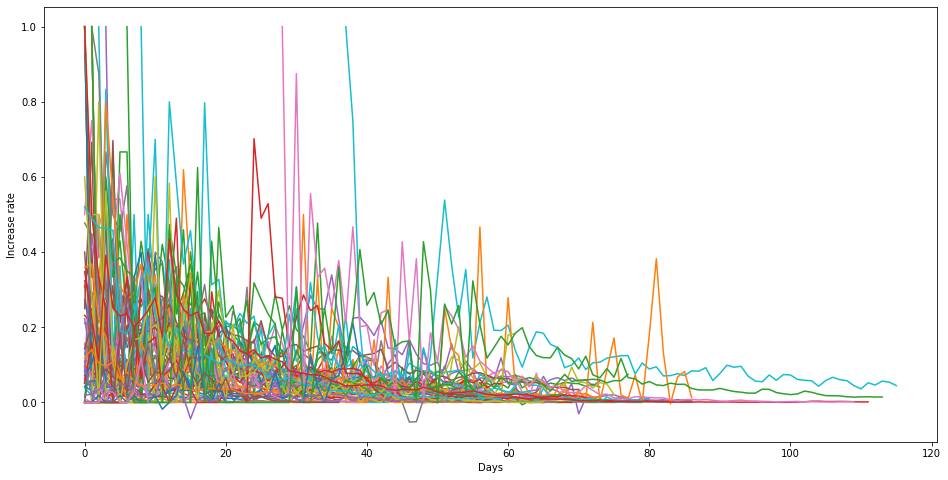

In [11]:
# fig,axes = plt.subplots(14,5,figsize=(40,50))
fig= plt.figure(figsize=(16,8))
for i,c in enumerate(unique_co):
#     if i > 10:
#         break
    new_df = data[data['Country'] == '{}'.format(c)]
    i_rate = new_df['Increase_rate']
    #print(i_rate)
    plt.plot(np.arange(len(i_rate)),i_rate)
#     plt.title(c)
    plt.xlabel('Days')
    plt.ylabel('Increase rate')

### Get figures on increasing rate with different measurements and stingency index. 

#### Define a function to draw required figures.

In [12]:
def specifiedIncreaseRateFigure(parameter):
    fig,axes = plt.subplots(math.ceil(numOfCountries / 5),5,figsize=(40,50))
    for i, country in enumerate(set(data["Country"].values.tolist())):
        new_df = data[data['Country'] == '{}'.format(country)]
        i_rate = new_df['Increase_rate']
        i_rate = (i_rate - np.mean(i_rate)) / np.std(i_rate)
        stay_home = new_df[parameter]
        if max(stay_home) == min(stay_home):
            stay_home = [0.1 for _ in range(len(stay_home))]
        else:
            stay_home = (stay_home - np.mean(stay_home)) / np.std(stay_home)
        ax=axes[i // 5, i % 5]
        ax.plot(np.arange(len(i_rate)),i_rate)
        ax=axes[i // 5, i % 5]
        ax.plot(np.arange(len(stay_home)),stay_home)
        ax.set_title(country)

#### Increase rate with Stay at home requirements

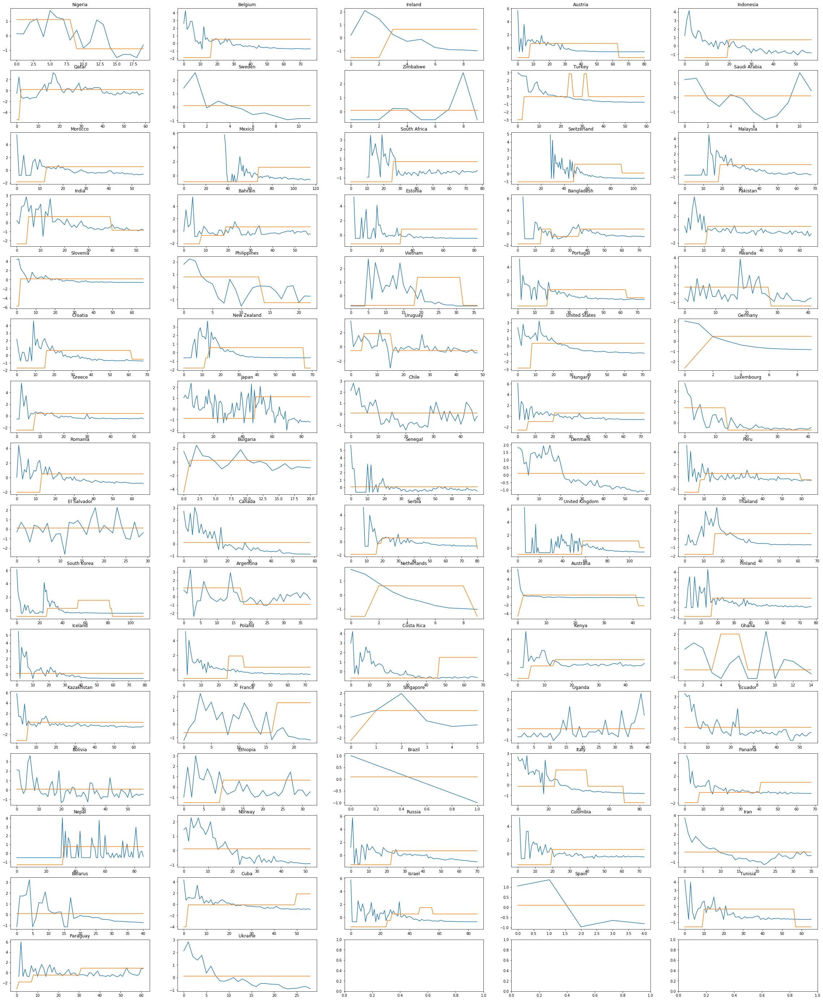

In [13]:
specifiedIncreaseRateFigure("Stay at home requirements")

#### Increase rate with Workplace closing

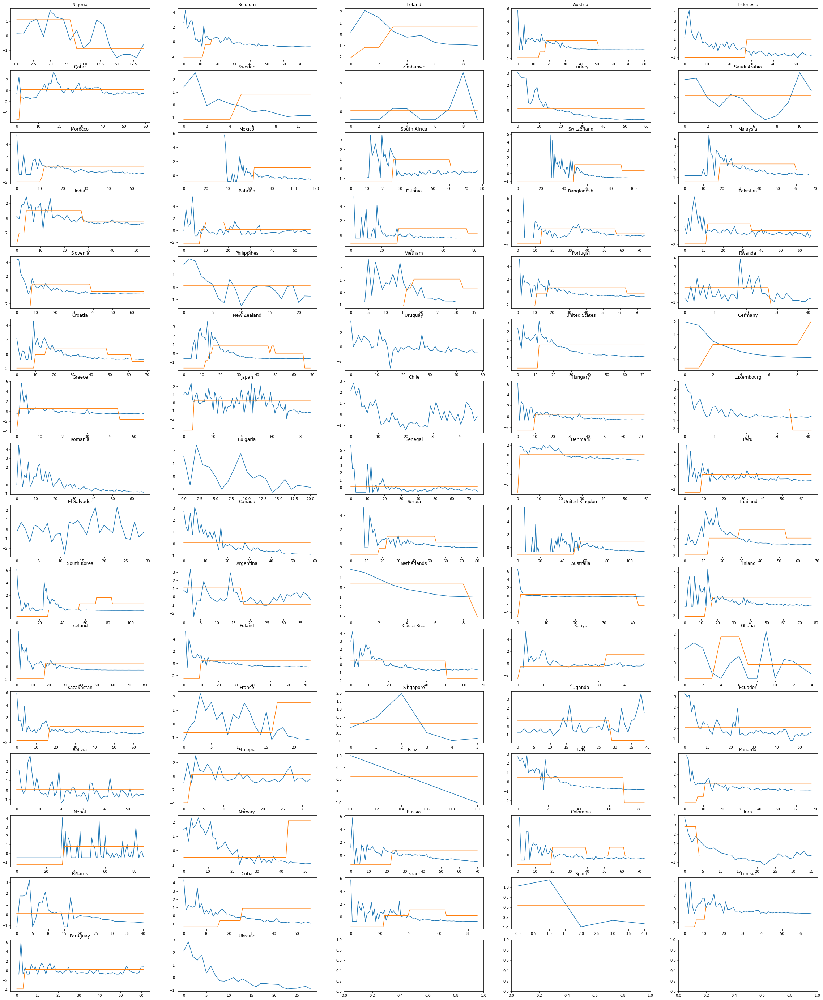

In [14]:
specifiedIncreaseRateFigure("Workplace closing")

In brute force deducing,we can find a negatively correlation between working place closing and increasing rate. 

#### Increase rate with Cancel public events

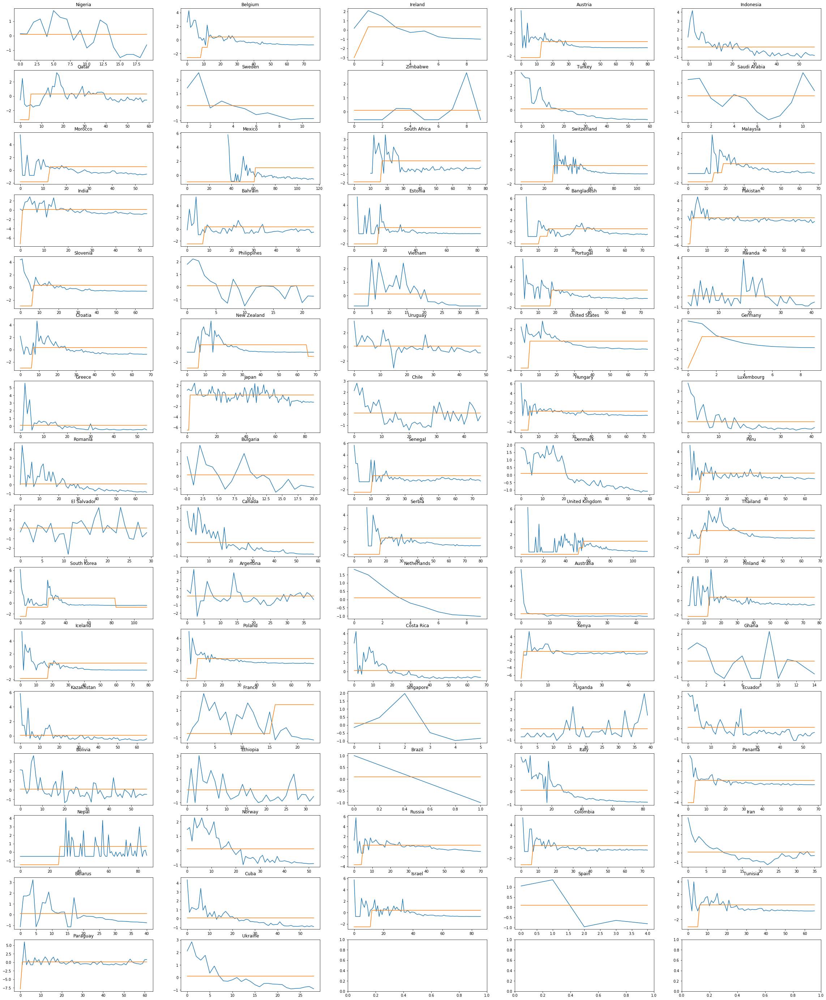

In [15]:
specifiedIncreaseRateFigure("Cancel public events")

#### Increase rate with Close public transport

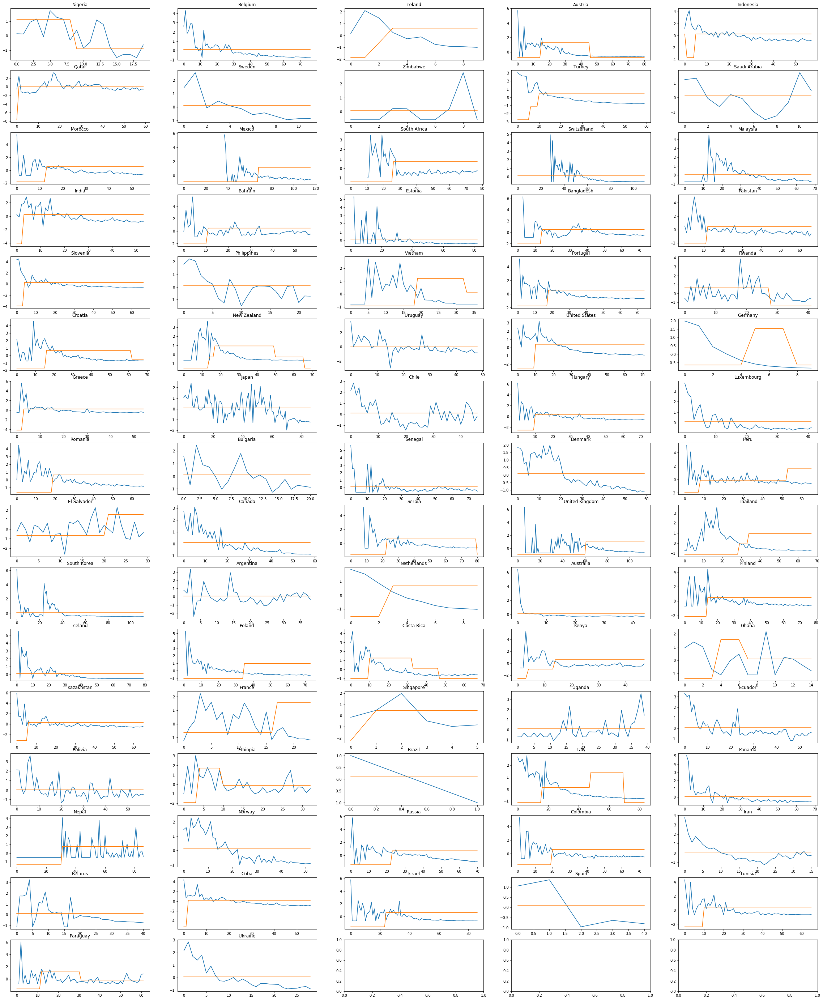

In [16]:
specifiedIncreaseRateFigure("Close public transport")

#### Increase rate with Restrictions on gatherings. 

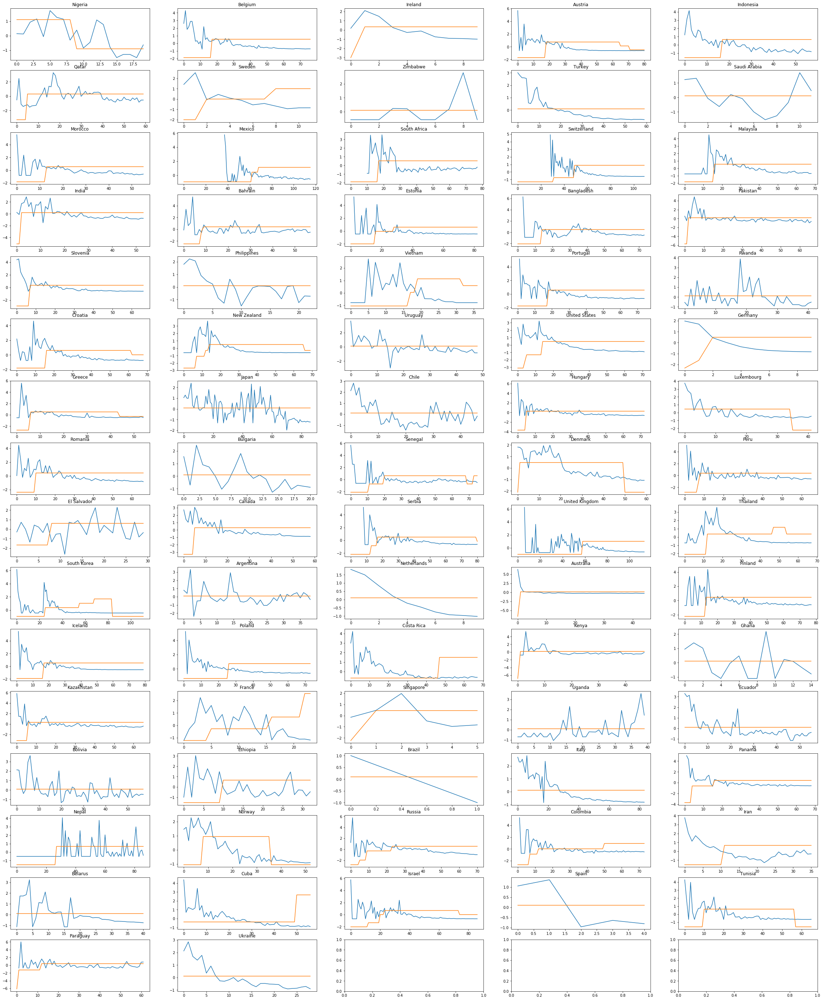

In [17]:
specifiedIncreaseRateFigure("Restrictions on gatherings")

Nearly for every country, once it raise its level on restrictions on gathering, it will meet reducing in increasing rate in a few days, which is different from other measurements. 

#### Increase rate with Restrictions on internal movement.

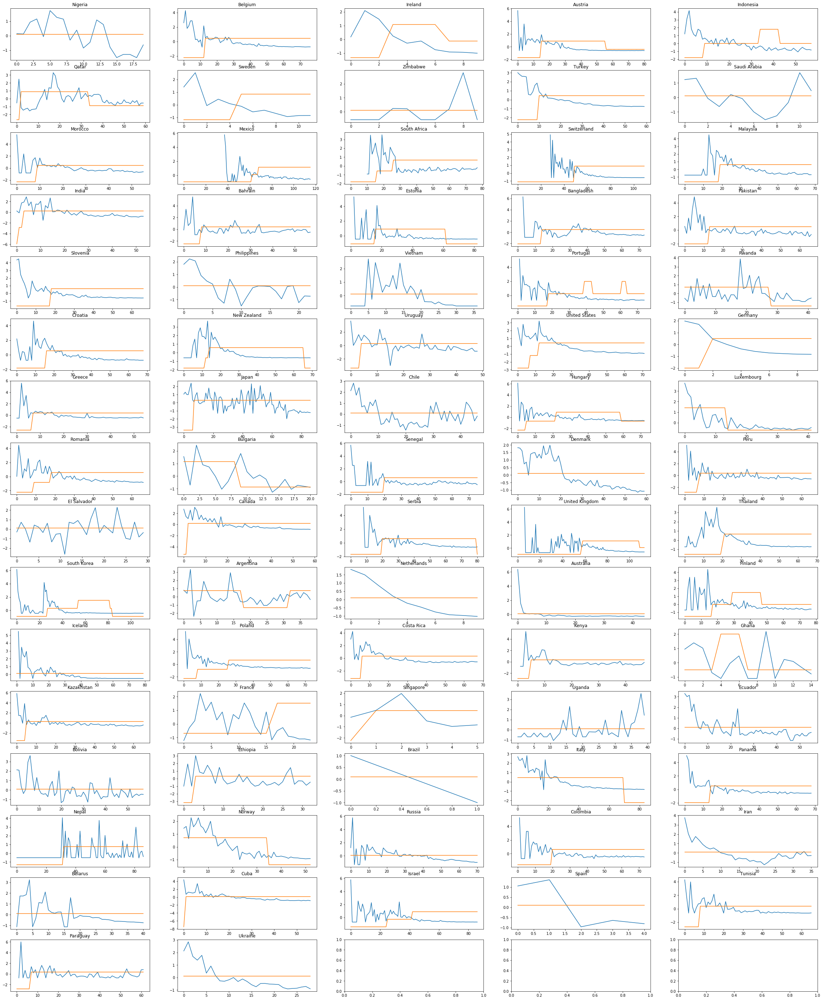

In [18]:
specifiedIncreaseRateFigure("Restrictions on internal movement")

#### Increase rate with International travel controls

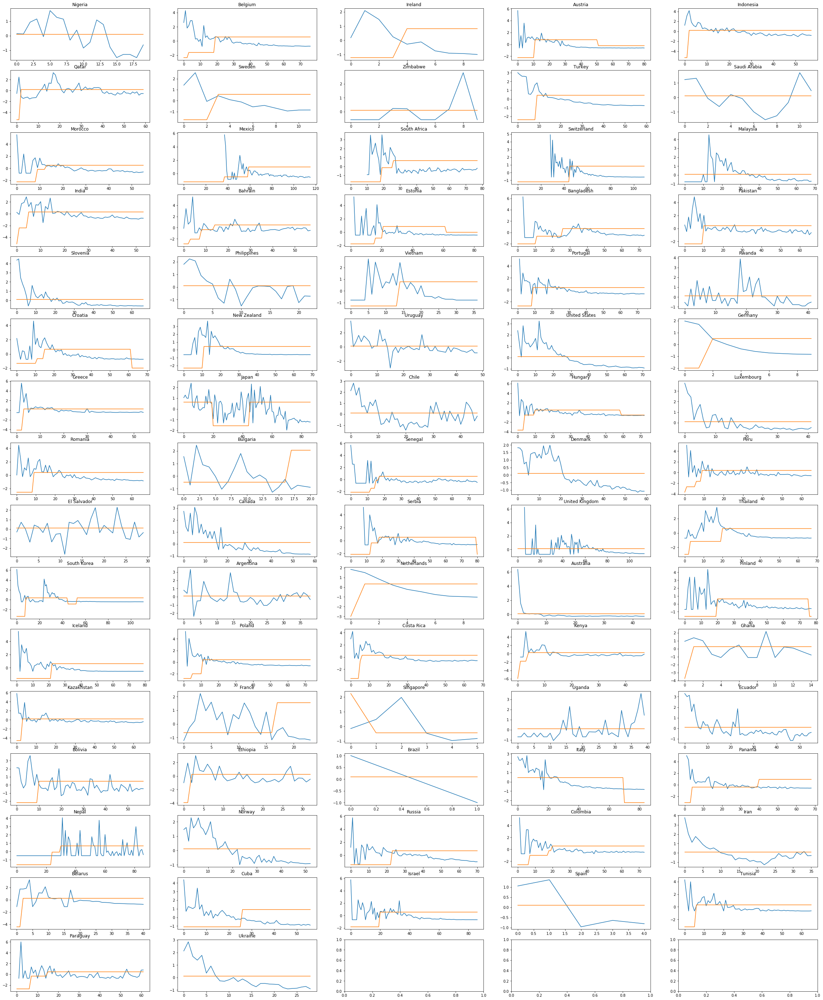

In [19]:
specifiedIncreaseRateFigure("International travel controls")

For most countries, there's a negatively correlation between increaseing rate and international travel controls,like Singapore and Ireland. Singapore is the only country that once lowered its international travel controls level during this epidemic spreading. 

#### Increase rate with public information campaigns

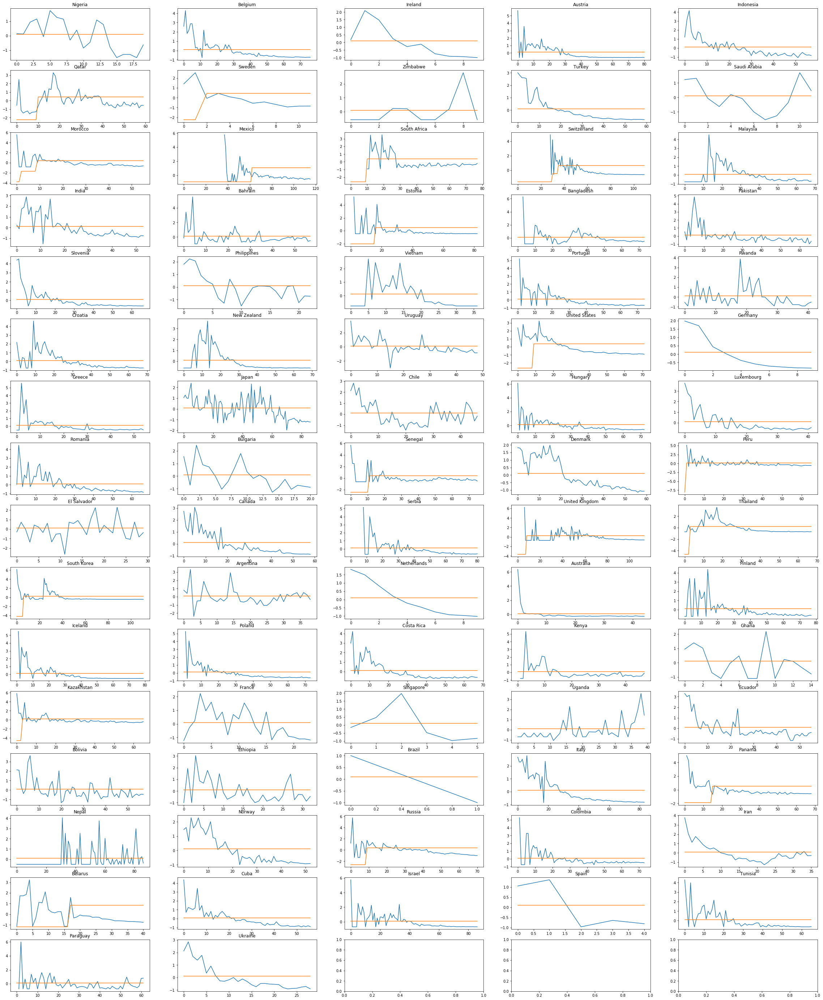

In [20]:
specifiedIncreaseRateFigure("Public information campaigns")

#### Increase rate with stringency

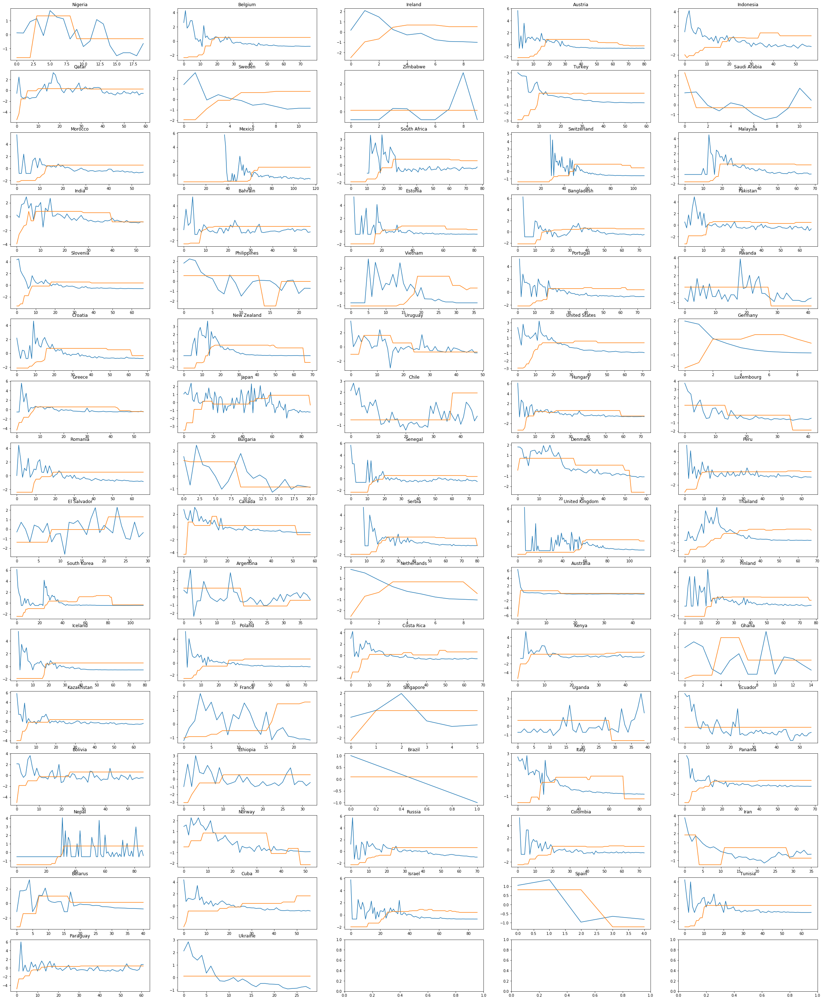

In [21]:
specifiedIncreaseRateFigure("stringency")

#### Correlation between epidemic related variables

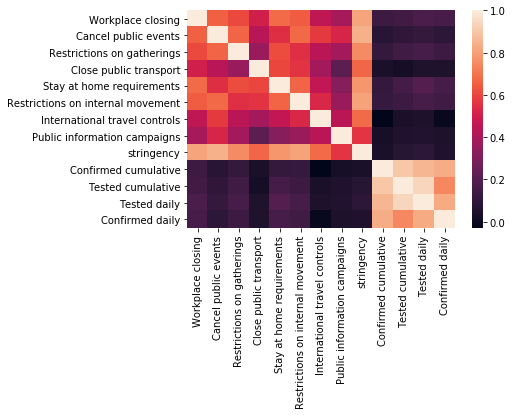

In [22]:
sns.heatmap(data[["Workplace closing","Cancel public events",
                "Restrictions on gatherings","Close public transport", "Stay at home requirements",
                "Restrictions on internal movement", "International travel controls","Public information campaigns",
                "stringency","Confirmed cumulative","Tested cumulative", "Tested daily", "Confirmed daily"]].corr())

#### The data related to confirmed cases and tested cases are highly correlated, but it is worth noting that the linear correlation between the increase rate and the infection density is not high. The figure reflects the correlation between the value of stringency and confirmed cases.


#### The growth trend of different countries

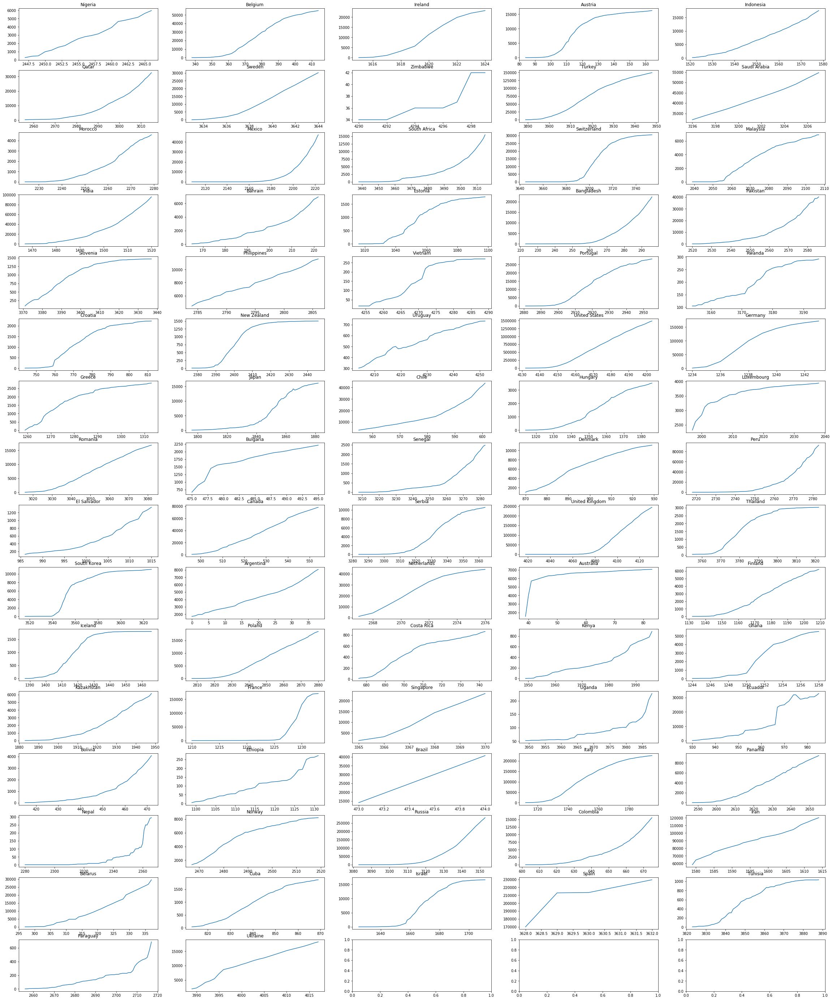

In [23]:
fig,axes = plt.subplots(math.ceil(numOfCountries / 5),5,figsize=(40,50))
for i, country in enumerate(set(data["Country"].values.tolist())):
    ax=axes[i // 5, i % 5]
    ax.plot(data[data["Country"]==country]["Confirmed cumulative"])
    ax.set_title(country)

#### In order to discover the relationship between the progress of the epidemic situation in various countries and the government's reaction measurements, we use the sigmoid function to map these two values to [0,1]. It can be seen from the figure that some government actions have a certain relationship with the progress of the epidemic, such as UK and Estonia.

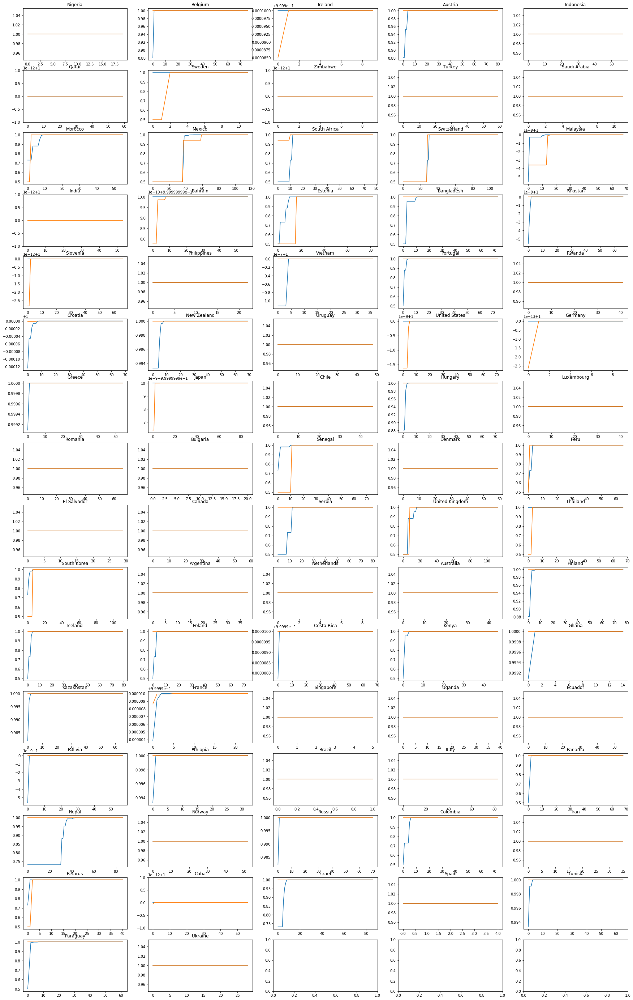

In [24]:
def sigmoid(x):
    return 1/(1+np.exp(-x))
fig,axes = plt.subplots(math.ceil(numOfCountries / 5),5,figsize=(30,50))
for i, country in enumerate(set(data["Country"].values.tolist())):
    ax=axes[i // 5, i % 5]
    ax.plot(sigmoid(data[data["Country"]==country]["Confirmed cumulative"].values))
    ax.plot(sigmoid(data[data["Country"]==country]["stringency"].values))
    ax.set_title(country)

### Use decision tree and linear regression as predictive models to do prediction.

In [25]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression

#### Using linear regression to predict. 

In [26]:
clf2 = LinearRegression()
X = data[["Workplace closing","Cancel public events",
                "Restrictions on gatherings","Close public transport", "Stay at home requirements",
                "Restrictions on internal movement", "International travel controls","Public information campaigns",
                "stringency","Confirmed cumulative","Tested cumulative", "Tested daily"]]
y = data['Confirmed daily']
X_train, X_val, y_train, y_val = train_test_split(X,y, test_size=0.2)
clf2.fit(X_train ,y_train)
clf2.score(np.array(X_val) ,y_val)

0.8181060003931089

#### Using decision tree to predict. 

In [27]:
clf = DecisionTreeRegressor()
X = data[["Workplace closing","Cancel public events",
                "Restrictions on gatherings","Close public transport", "Stay at home requirements",
                "Restrictions on internal movement", "International travel controls","Public information campaigns",
                "stringency","Confirmed cumulative","Tested cumulative", "Tested daily"]]
y = data['Confirmed daily']
X_train, X_val, y_train, y_val = train_test_split(X,y, test_size=0.2)
clf.fit(X_train ,y_train)
clf.score(np.array(X_val) ,y_val)

0.8525852723820031

In [28]:
#["Workplace closing","Cancel public events","Restrictions on gatherings","Close public transport",
# "Stay at home requirements","Restrictions on internal movement","International travel controls","Public information campaigns",
# "stringency","Confirmed cumulative","Tested cumulative", "Tested daily"]
clf.feature_importances_

array([1.94694581e-04, 2.20857229e-05, 1.26944886e-03, 8.62040539e-03,
       2.16982213e-04, 3.40688542e-04, 1.21542888e-03, 7.66870413e-06,
       3.56269342e-02, 8.66314318e-01, 3.41333374e-02, 5.20380070e-02])

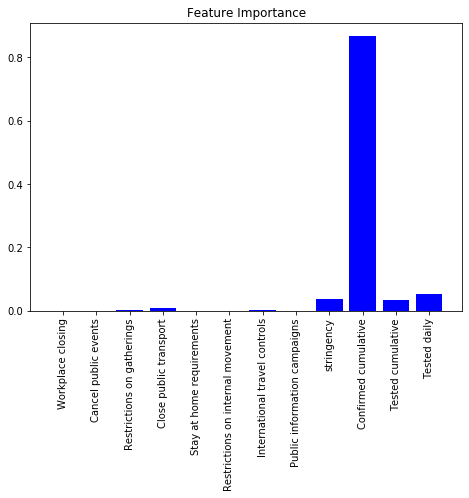

In [29]:
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
langs = ["Workplace closing","Cancel public events",
                "Restrictions on gatherings","Close public transport", "Stay at home requirements",
                "Restrictions on internal movement", "International travel controls","Public information campaigns",
                "stringency","Confirmed cumulative","Tested cumulative", "Tested daily"]
pct = clf.feature_importances_
ax.bar(langs,pct,color = 'b')
plt.title('Feature Importance')
plt.xticks(rotation='vertical')
plt.show()

From the future importance feature we can find that confirmed cumulative cases has the most contribution towards the daily confirmed cases.


#### Then we remove the cumulative data to train and get the feature importance

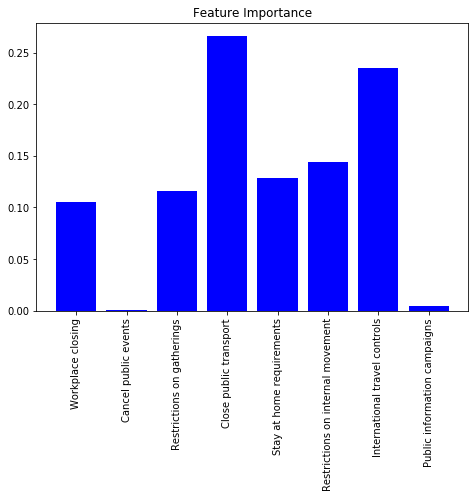

In [30]:
new_clf = DecisionTreeRegressor()
X = data[["Workplace closing","Cancel public events",
                "Restrictions on gatherings","Close public transport", "Stay at home requirements",
                "Restrictions on internal movement", "International travel controls","Public information campaigns"]]
y = data['Confirmed daily']
X_train, X_val, y_train, y_val = train_test_split(X,y, test_size=0.2)
new_clf.fit(X_train ,y_train)
new_clf.score(np.array(X_val) ,y_val)

fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
langs = ["Workplace closing","Cancel public events",
                "Restrictions on gatherings","Close public transport", "Stay at home requirements",
                "Restrictions on internal movement", "International travel controls","Public information campaigns"]
pct = new_clf.feature_importances_
ax.bar(langs,pct,color = 'b')
plt.title('Feature Importance')
plt.xticks(rotation='vertical')
plt.show()

Among the government measurements, the top ranking features, even though the exact value might vary, are: **International travel controls**, and **close public transportation**. 

# Summary

#### Describe the methodology you used to answer your research question：
In this analysis, we have firstly fixed the wrong data from the last step, fill or drop invalid data based on different situations. Then we calculated new columns (Increase rate) and (Infection density) for a better description. 
Then we used virtualization to see the correlation between different measurements and increase rate, which we care the most. 
Finally, we have used two basic machine learning models to train data. By using sklearn, we can predict confirmed daily (new cases daily) with different accuracy. Finally, we created a feature importance figure to demonstrate the contribution of each factor towards Covid-19 spreading. 

#### The challenges you faced:
The first challenge is choosing a proper way to present data. Since we don't have too many experiences in data science, we've spent a lot of time studying and researching. For example, data normalization in figures to present a more readable figure of two trending lines in one chart).
The second challenge is that our data is limited and biased. Ideally, we need to include more data that can reflect one country from different perspectives, like the population, religions, etc. Better data sources are needed. 
Another difficulty is that the data itself. The data volume is relatively low. For each country, it has 40-50 records on average, which makes it hard to analyze and predict accurately. The measurements are quantized into values from 1 to 4; the granularity level is high. 

#### Findings and conclusion:

Through the virtualization of increase rate with different factors:
As a compound value for the total restriction level of a country, stringency has an apparent negative correlation with the increase rate. Once the stringency value reaches the peak, the increase rate will seldomly increase though it might fluctuate within a small range.
For most of the measurements, they have a negative correlation with the increase rate. However, the increase rate has different sensitivity towards different measurements. 
In general, every time a government raises the restriction level of one measurement, we can observe a deduction of increase rate in a short period one time. However, in a long term perspective, the increase rate will fluctuate even the measurement level is stable. This might be caused by multiple reasons: 1. Our data schema can not perfectly reflect the government's behavior and influence on Covid-19. 2. The measurement level is a relative value whose absolute value differs from country to country, lower granularity and more precise data are needed. 3. The government measurement factor is not the only factor that has a profound influence on the spreading. More factors should be included for consideration, like socioeconomic, political, and geographic environments, etc.


According to the heatmap and feature importance figure, we can see that the cumulatively confirmed cases index has the most dominant influence on the increased cases daily.
According to our decision tree model, close public transportation and international travel control hold the highest feature importance among the measurements, and then it comes to other features, whose ranking may vary. So for a government defending COVID-19, the fast reaction should be highly valued since the total number has the highest contribution to this epidemic spreading. Ideally, it should be contained in the primitive accumulation stage. Otherwise, the government measurements would have less impact on the increasing number as time passes by. 

#### Expectation 
By utilizing these methods, we can see the stringency index has much less contribution to the daily increased confirmed case than cumulatively cases, which is counter-intuitive. 
There might be multiple reasons. 
One is that the data volume is small, much more dara are needed. 
Anthor reason is that this schema of this dataset is not enough to reflect the influence of the government measurements on spreading of COVID-19, we need to find a more elaborated schema. 
Current data sample has bias, it can not reflect other factors' distribution, like population, religions, economics, geographic environmentsand so on. More datasets from different perspectives are needed. 

Those are just some assumption, further research and study are needed on this topic. 